# 텍스트 군집 분석

In [3]:
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'
import matplotlib.font_manager as fm
fontpath = '/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf'
fontprop = fm.FontProperties(fname=fontpath, size=8) 
#폰트종류설정
plt.rcParams["font.family"] = 'NanumGothic'

#폰트크기설정
#plt.rcParams["font.size"] = 20

## 데이터 전처리

In [5]:
import konlpy
import urllib.request
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('seaborn-white')

from konlpy.tag import Mecab

/tmp/ipykernel_132663/3924586971.py:7: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-white')


In [6]:
import pandas as pd
import numpy as np
data_df = pd.read_csv('../data/ulsan_rest_table_ver3.csv')
data_df.head()

,p_id,place_id,u_id,user_id,score,comment
0,0,225토마토스트릿,24506,힘내라힘,2,분위기에 비해 맛은 쏘쏘...
1,0,225토마토스트릿,24493,히둥이,5,NaN
2,0,225토마토스트릿,24328,황영하,5,파스타 너무 맛있게 잘 먹었어요 태화동에 맛집이 별로 없어서 아쉬웠는데 맛집을 발견...
3,0,225토마토스트릿,24247,황규현,5,스테이크 부위가 바뀐것같은데 바뀐고기가 훨씬 좋은것 같아요..!.!!! 육향도 좋고...
4,0,225토마토스트릿,24022,호두과자,5,NaN


In [7]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54500 entries, 0 to 54499
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   p_id      54500 non-null  int64 
 1   place_id  54500 non-null  object
 2   u_id      54500 non-null  int64 
 3   user_id   54500 non-null  object
 4   score     54500 non-null  int64 
 5   comment   40225 non-null  object
dtypes: int64(3), object(3)
memory usage: 2.5+ MB


In [8]:
data_df['comment'] = data_df['comment'].str.replace("[^ㄱ-하-ㅣ가-힣 ]", "")

/tmp/ipykernel_132663/2728893579.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  data_df['comment'] = data_df['comment'].str.replace("[^ㄱ-하-ㅣ가-힣 ]", "")


In [9]:
print(data_df.isnull().sum())

data_df = data_df.dropna(how='any')

p_id            0
place_id        0
u_id            0
user_id         0
score           0
comment     14275
dtype: int64


In [10]:
data_df['comment'].replace('', np.nan, inplace=True)
data_df = data_df.dropna(how='any')
print(len(data_df))
print(data_df.isnull().sum())

40100
p_id        0
place_id    0
u_id        0
user_id     0
score       0
comment     0
dtype: int64


## 토큰화 및 불용어 제거

In [11]:
file = open('../data/stop_word.txt', 'r')

stopWord = []
l = ''
while True:
    l = file.readline()
    stopWord.append(l[:-1])
    if l == '':
        break

In [12]:
len(stopWord)

676

In [13]:
from konlpy.tag import Mecab

mecab =Mecab()

reviews = []
for sentence in data_df['comment']:
    reviews.append([word for word in mecab.nouns(str(sentence)) if not word in stopWord])

print(len(reviews))
data_df['reviews'] = reviews

40100


In [14]:
data_df.head()

,p_id,place_id,u_id,user_id,score,comment,reviews
0,0,225토마토스트릿,24506,힘내라힘,2,분위기에 비해 맛은 쏘쏘,"[분위기, 맛, 쏘, 쏘]"
2,0,225토마토스트릿,24328,황영하,5,파스타 너무 맛있게 잘 먹었어요 태화동에 맛집이 별로 없어서 아쉬웠는데 맛집을 발견...,"[파스타, 태화동, 맛집, 맛집, 발견, 기분]"
3,0,225토마토스트릿,24247,황규현,5,스테이크 부위가 바뀐것같은데 바뀐고기가 훨씬 좋은것 같아요 육향도 좋고 부드러워서 ...,"[스테이크, 부위, 데, 고기, 육향, 고기]"
5,0,225토마토스트릿,21835,쭌쭌,1,분위기는 좋으나 바닷물을 마신기분이랄까요음식보단 물을 많이 먹어 기분좋은 포만감을 ...,"[분위기, 바닷물, 기분, 음식, 물, 기분, 포만감, 주문, 시, 소금, 간, 부..."
6,0,225토마토스트릿,20092,재우,5,분위기며 맛이며 그냥 너무좋아요 가족끼리가도 너무좋을거같고 부산 광안리에도 새로 오...,"[분위기, 맛, 가족, 거, 부산, 광안리, 오픈, 거기, 사람, 예약, 그만큼, ..."


## Word2Vec 생성

Skip gram 활용

In [15]:
from gensim.models import Word2Vec
from sklearn.manifold import TSNE
from matplotlib import font_manager as fm
from matplotlib import rc

In [16]:
word2vec_sg = Word2Vec(reviews, min_count=3, vector_size=100, window=5, sg=1)

In [17]:
word2vec_sg.wv.most_similar('맛')

[('대박', 0.7200769782066345),
 ('특색', 0.7109120488166809),
 ('예술', 0.6973549127578735),
 ('나세', 0.6959314346313477),
 ('활어', 0.6907781362533569),
 ('조아', 0.6907512545585632),
 ('평타', 0.690740704536438),
 ('별루', 0.6897253394126892),
 ('평균', 0.6879442930221558),
 ('돈값', 0.687240719795227)]

## t-sne을 활용한 시각화

In [18]:
tsne = TSNE(n_components=2) # n_components는 차원을 뜻함 

In [19]:
vocab = word2vec_sg.wv.key_to_index
similarity = word2vec_sg.wv[vocab]

In [20]:
import pandas as pd

transform_similarity = tsne.fit_transform(similarity) # 전체 similarity를 tsne n_components만큼 변형 ex n=2 -> 2차원
df = pd.DataFrame(transform_similarity, index=vocab, columns=['x', 'y'])

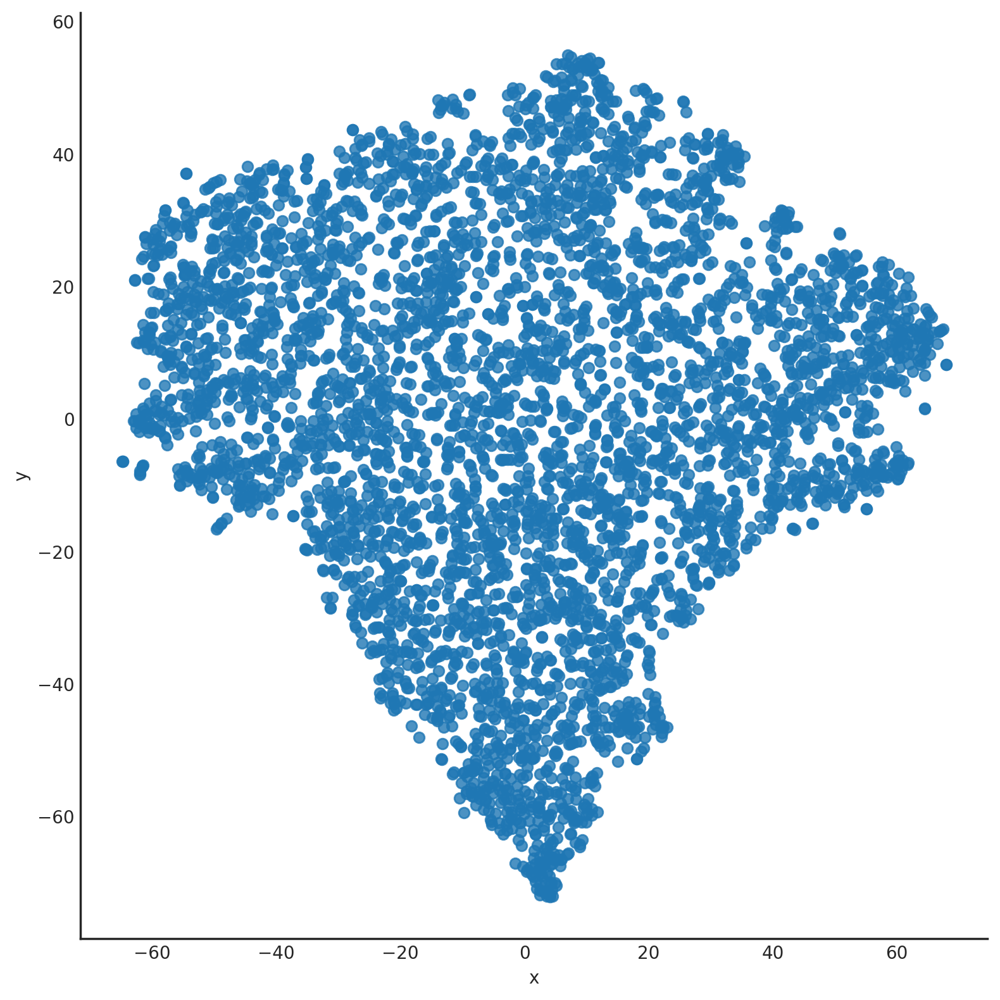

In [21]:
sns.lmplot(x= 'x',y= 'y', data=df, fit_reg=False, height=8)
plt.show()

CBOW 활용

In [22]:
word2vec_cb = Word2Vec(reviews, min_count=3, vector_size=100, window=5, sg=0)

In [23]:
word2vec_cb.wv.most_similar('맛')

[('보통', 0.9155504703521729),
 ('남', 0.8852710127830505),
 ('퀄리티', 0.8742722272872925),
 ('개인차', 0.8655598163604736),
 ('질', 0.862716019153595),
 ('평균', 0.8610039353370667),
 ('안음', 0.8559321761131287),
 ('요점', 0.8541570901870728),
 ('합리', 0.8504253029823303),
 ('기대', 0.8488768339157104)]

## t-sne을 활용한 시각화(2차원)

In [24]:
tsne = TSNE(n_components=2) # n_components는 차원을 뜻함 

In [28]:
vocab = word2vec_sg.wv.key_to_index
similarity = word2vec_cb.wv[vocab]

In [29]:
transform_similarity = tsne.fit_transform(similarity) # 전체 similarity를 tsne n_components만큼 변형 ex n=2 -> 2차원
df = pd.DataFrame(transform_similarity, index=vocab, columns=['x', 'y'])

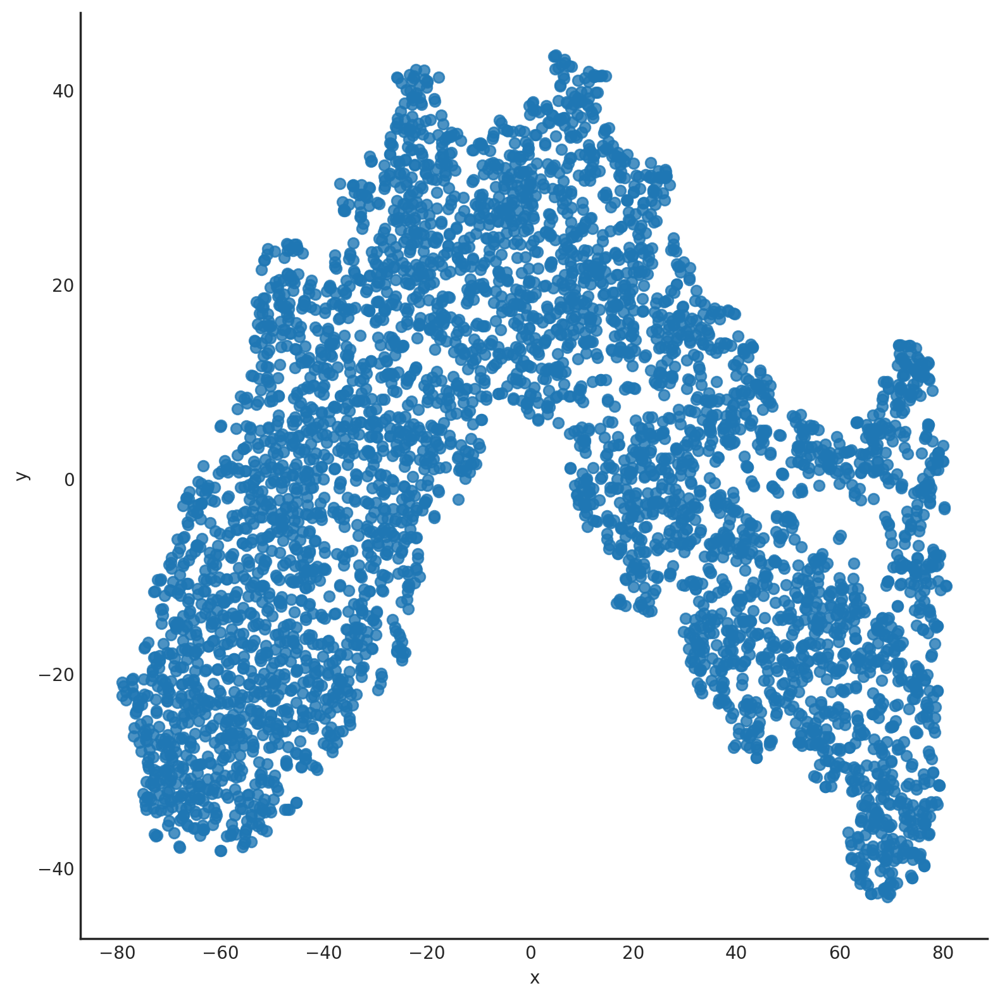

In [30]:
sns.lmplot(x= 'x',y= 'y', data=df, fit_reg=False, height=8)
plt.show()

## t-sne을 활용한 시각화(3차원)

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap
# plt.style.use('seaborn-white')

In [33]:
tsne = TSNE(n_components=3) # n_components는 차원을 뜻함 

In [35]:
transform_similarity = tsne.fit_transform(similarity) # 전체 similarity를 tsne n_components만큼 변형 ex n=2 -> 2차원
df = pd.DataFrame(transform_similarity, index=vocab, columns=['x', 'y', 'z'])

/usr/local/lib/python3.8/dist-packages/matplotlib/collections.py:1080: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


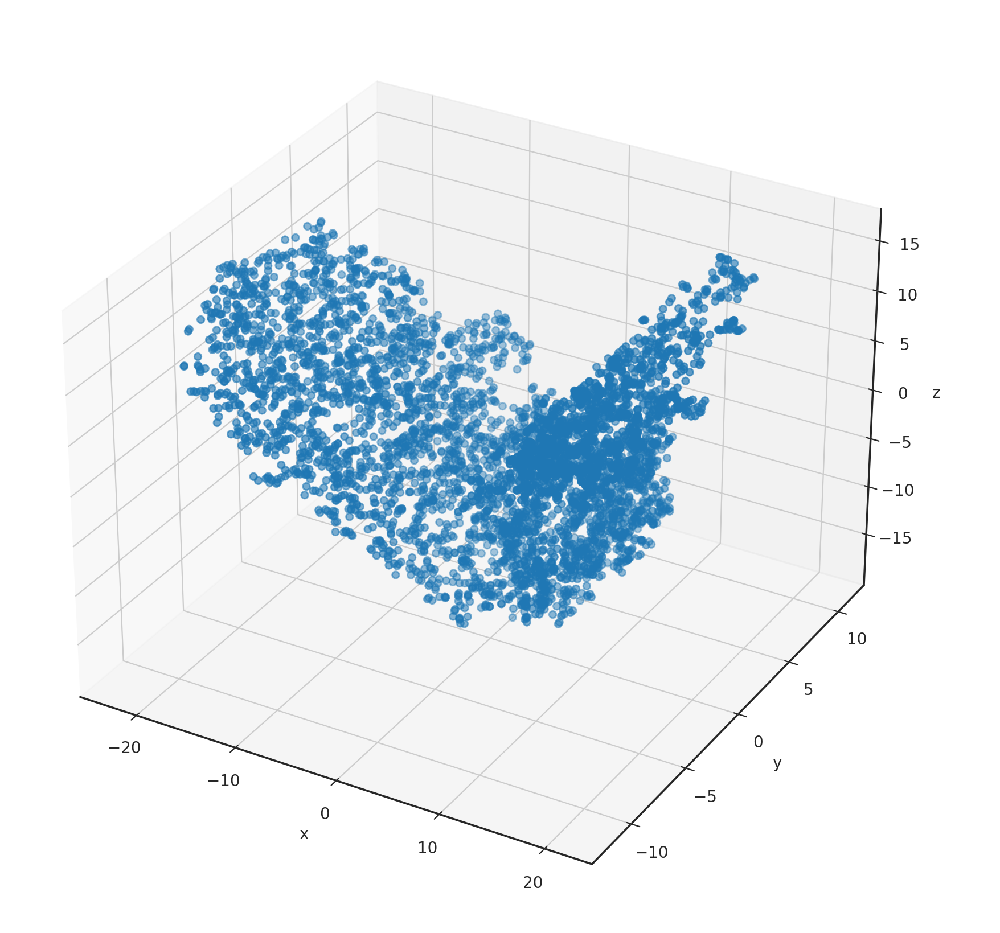

In [36]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap
# plt.style.use('seaborn-white')
fig = plt.figure(figsize=(12, 8))
ax = Axes3D(fig)
fig.add_axes(ax)
# ax = fig.add_subplot(111, projection = '3d')
cmap = ListedColormap(sns.color_palette("husl", 256).as_hex())
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")

sc = ax.scatter(df['x'], df['y'], df['z'])
plt.legend(*sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

## 군집화

### 계층적 군집화

#### ward

In [38]:
from sklearn.cluster import AgglomerativeClustering

ward = AgglomerativeClustering(n_clusters=10, linkage='ward')
predict = ward.fit_predict(df)
# data_df['clusters'] = predict
df['predict'] = predict

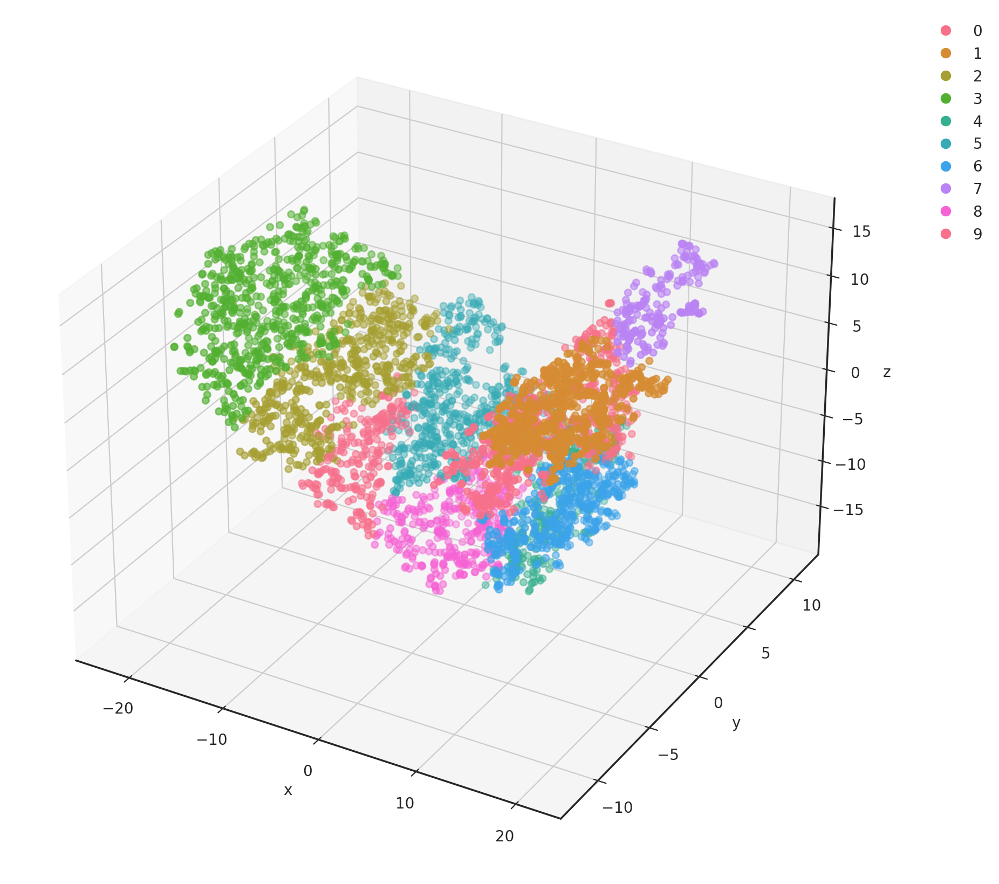

In [39]:
fig = plt.figure(figsize=(12, 8))
ax = Axes3D(fig)
fig.add_axes(ax)
# ax = fig.add_subplot(111, projection = '3d')
cmap = ListedColormap(sns.color_palette("husl", 256).as_hex())
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")

sc = ax.scatter(df['x'], df['y'], df['z'], c=df['predict'], cmap=cmap)
plt.legend(*sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

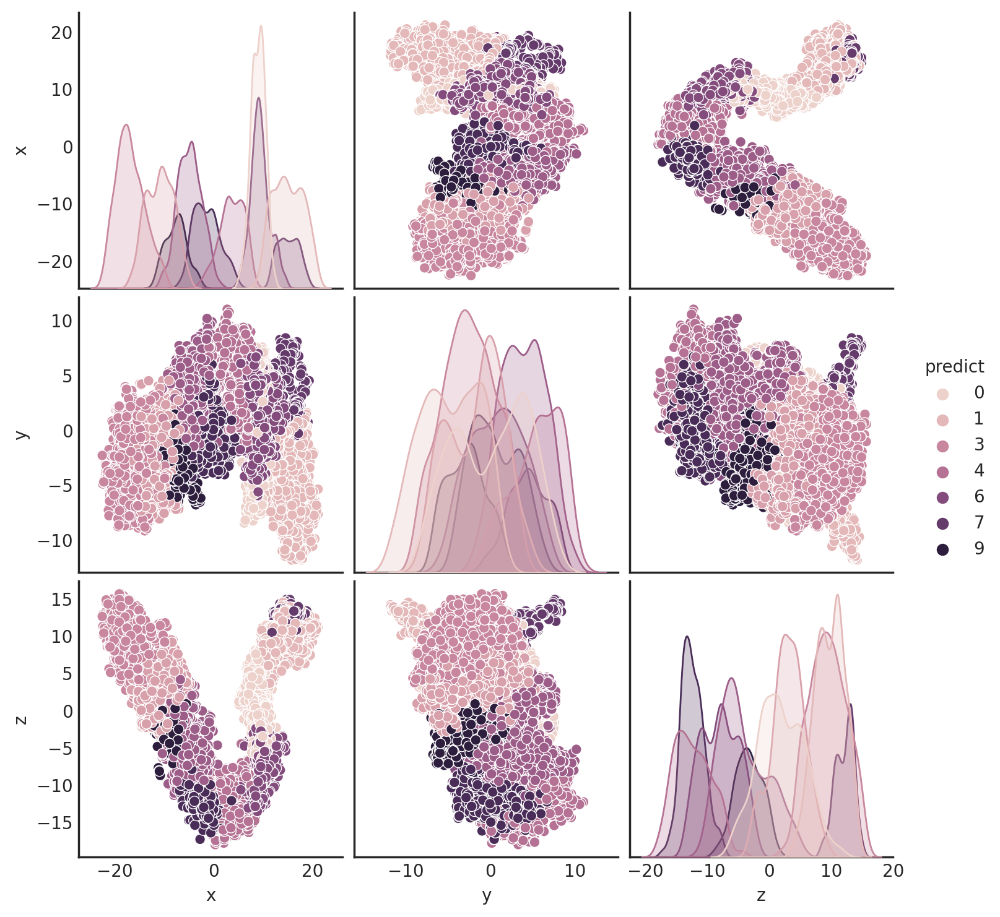

In [40]:
sns.pairplot(df, hue='predict')

<Axes: xlabel='predict', ylabel='count'>

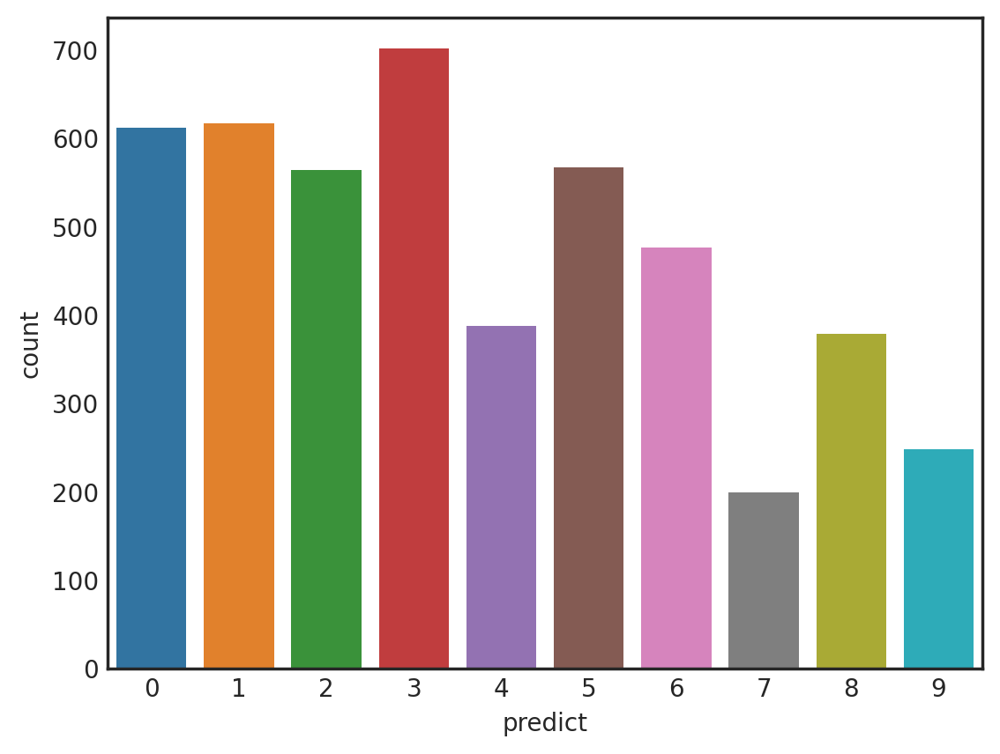

In [41]:
sns.countplot(x=df['predict'])

In [42]:
cluster0 = list(df[df['predict']==0].index)
cluster1 = list(df[df['predict']==1].index)
cluster2 = list(df[df['predict']==2].index)
cluster3 = list(df[df['predict']==3].index)
cluster4 = list(df[df['predict']==4].index)
cluster5 = list(df[df['predict']==5].index)
cluster6 = list(df[df['predict']==6].index)
cluster7 = list(df[df['predict']==7].index)
cluster8 = list(df[df['predict']==8].index)
cluster9 = list(df[df['predict']==9].index)

In [43]:
print(f'cluster0: {cluster0[:10]}')
print(f'cluster1: {cluster1[:10]}')
print(f'cluster2: {cluster2[:10]}')
print(f'cluster3: {cluster3[:10]}')
print(f'cluster4: {cluster4[:10]}')
print(f'cluster5: {cluster5[:10]}')
print(f'cluster6: {cluster6[:10]}')
print(f'cluster7: {cluster7[:10]}')
print(f'cluster8: {cluster8[:10]}')
print(f'cluster9: {cluster9[:10]}')

cluster0: ['핫', '케잌', '브런치', '공짜', '딸기', '감', '원두', '특색', '드립', '접대']
cluster1: ['맛', '친절', '음식', '가격', '고기', '집', '맛집', '직원', '울산', '듯']
cluster2: ['가자미회', '개인차', '한가위', '환장', '치곤', '다림', '효', '용서', '참조', '옻닭']
cluster3: ['마시', '바램', '난무', '군대', '웰빙', '픽', '식성', '텀블러', '찰기', '럼']
cluster4: ['세팅', '속도', '뼈다귀', '요원', '체계', '장어구이', '햇살', '계곡', '여성', '풍광']
cluster5: ['적당', '분위', '수다', '칸막이', '체인', '울산역', '돈값', '쾌', '장난아', '로컬']
cluster6: ['소소', '간짜장', '돌판', '초심', '시금치', '우수', '옆집', '소면', '니다', '밥맛']
cluster7: ['곳', '수', '커피', '분위기', '사람', '주차', '뷰', '주차장', '방문', '번']
cluster8: ['산채', '넹', '우린', '분식집', '죽', '복요리', '가리비', '로스', '참맛', '구요']
cluster9: ['디쉬', '회정', '혜자', '주먹밥', '싱거', '호주', '땅', '형편', '납득', '제입맛에']


#### average

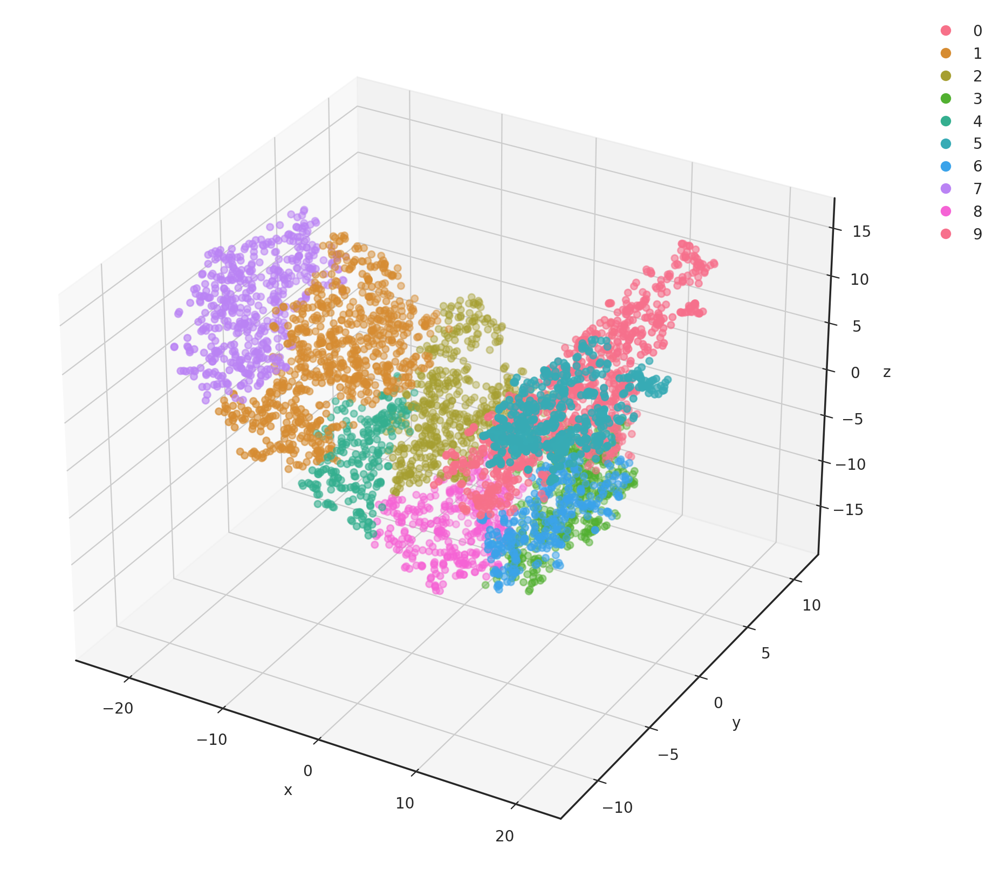

In [44]:
avg = AgglomerativeClustering(n_clusters=10, linkage='average')
predict= avg.fit_predict(df)
results = df
results['predict'] = predict

# plt.style.use('seaborn-white')
fig = plt.figure(figsize=(12, 8))
ax = Axes3D(fig)
fig.add_axes(ax)
# ax = fig.add_subplot(111, projection = '3d')
cmap = ListedColormap(sns.color_palette("husl", 256).as_hex())
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")

sc = ax.scatter(df['x'], df['y'], df['z'], c=df['predict'], cmap=cmap)
plt.legend(*sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

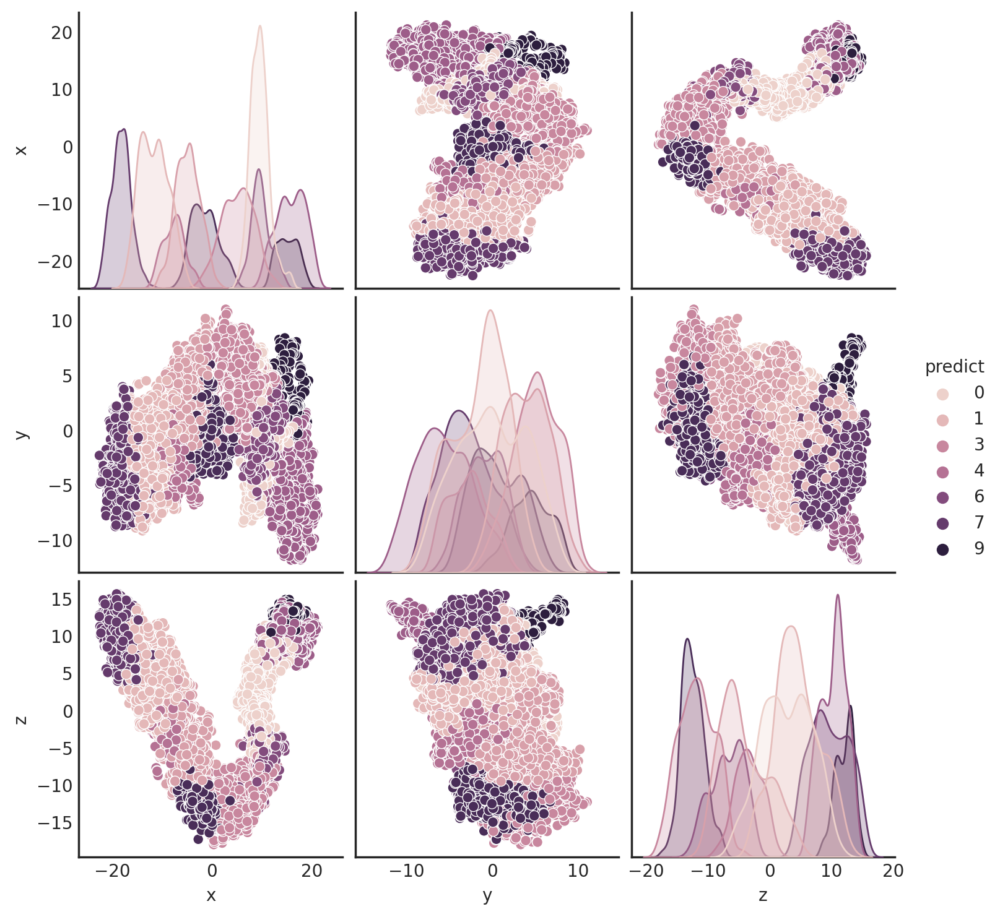

In [45]:
sns.pairplot(df, hue='predict')

<Axes: xlabel='predict', ylabel='count'>

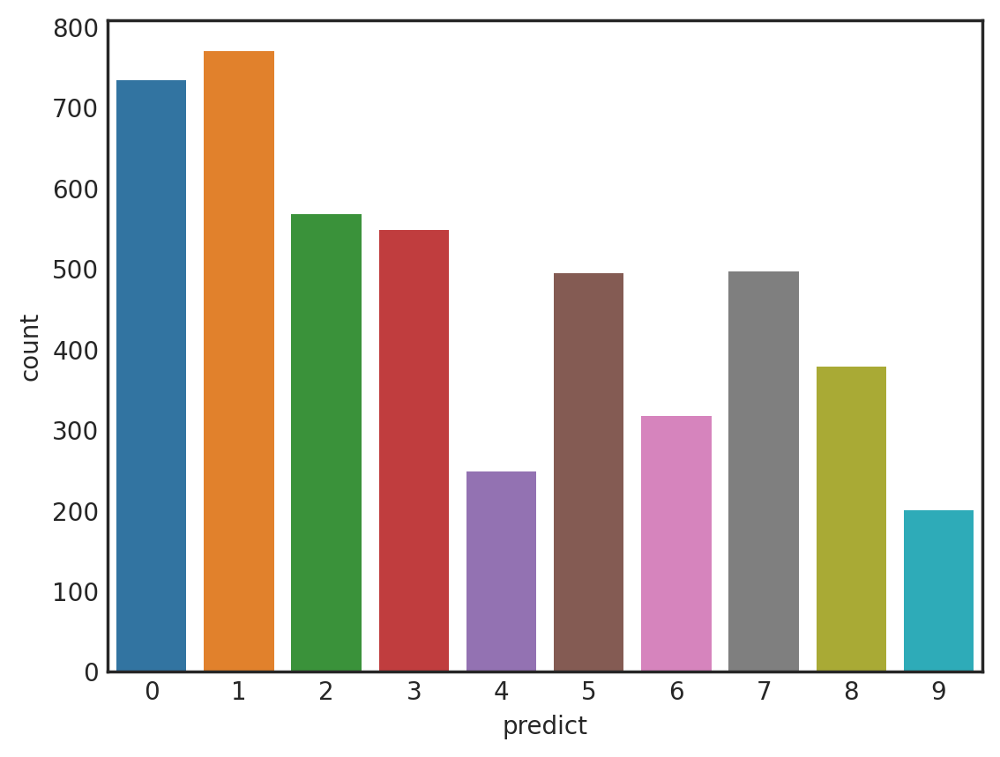

In [46]:
sns.countplot(x=df['predict'])

In [47]:
cluster0 = list(df[df['predict']==0].index)
cluster1 = list(df[df['predict']==1].index)
cluster2 = list(df[df['predict']==2].index)
cluster3 = list(df[df['predict']==3].index)
cluster4 = list(df[df['predict']==4].index)
cluster5 = list(df[df['predict']==5].index)
cluster6 = list(df[df['predict']==6].index)
cluster7 = list(df[df['predict']==7].index)
cluster8 = list(df[df['predict']==8].index)
cluster9 = list(df[df['predict']==9].index)

In [48]:
print(f'cluster0: {cluster0[:10]}')
print(f'cluster1: {cluster1[:10]}')
print(f'cluster2: {cluster2[:10]}')
print(f'cluster3: {cluster3[:10]}')
print(f'cluster4: {cluster4[:10]}')
print(f'cluster5: {cluster5[:10]}')
print(f'cluster6: {cluster6[:10]}')
print(f'cluster7: {cluster7[:10]}')
print(f'cluster8: {cluster8[:10]}')
print(f'cluster9: {cluster9[:10]}')

cluster0: ['의사', '소문', '대접', '땐', '단골', '조아', '가요', '비스', '완벽', '짐']
cluster1: ['가자미회', '개인차', '한가위', '환장', '치곤', '다림', '효', '용서', '참조', '옻닭']
cluster2: ['적당', '분위', '수다', '칸막이', '체인', '울산역', '돈값', '쾌', '장난아', '로컬']
cluster3: ['세팅', '속도', '양호', '용', '성남동', '뼈다귀', '산지', '만족도', '주일', '요원']
cluster4: ['디쉬', '회정', '혜자', '주먹밥', '싱거', '호주', '땅', '형편', '납득', '제입맛에']
cluster5: ['맛', '친절', '음식', '가격', '고기', '집', '맛집', '직원', '울산', '듯']
cluster6: ['소소', '간짜장', '돌판', '초심', '시금치', '우수', '옆집', '소면', '니다', '밥맛']
cluster7: ['마시', '바램', '난무', '군대', '웰빙', '픽', '식성', '텀블러', '럼', '식점']
cluster8: ['산채', '넹', '우린', '분식집', '죽', '복요리', '가리비', '로스', '참맛', '구요']
cluster9: ['곳', '수', '커피', '분위기', '사람', '주차', '뷰', '주차장', '방문', '번']


#### complete

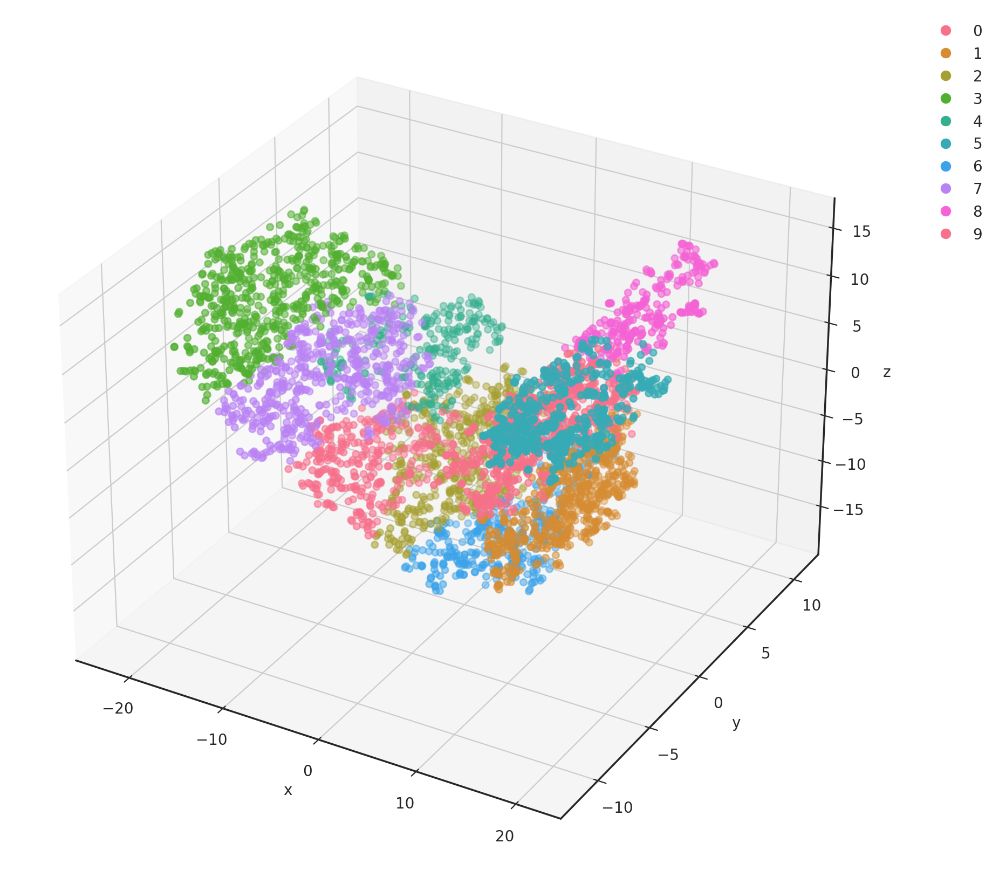

In [50]:
compl = AgglomerativeClustering(n_clusters=10, linkage='complete')
predict = compl.fit_predict(df)
results = df
results['predict'] = predict

fig = plt.figure(figsize=(12, 8))
ax = Axes3D(fig)
fig.add_axes(ax)
# ax = fig.add_subplot(111, projection = '3d')
cmap = ListedColormap(sns.color_palette("husl", 256).as_hex())
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")

sc = ax.scatter(df['x'], df['y'], df['z'], c=df['predict'], cmap=cmap)
plt.legend(*sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

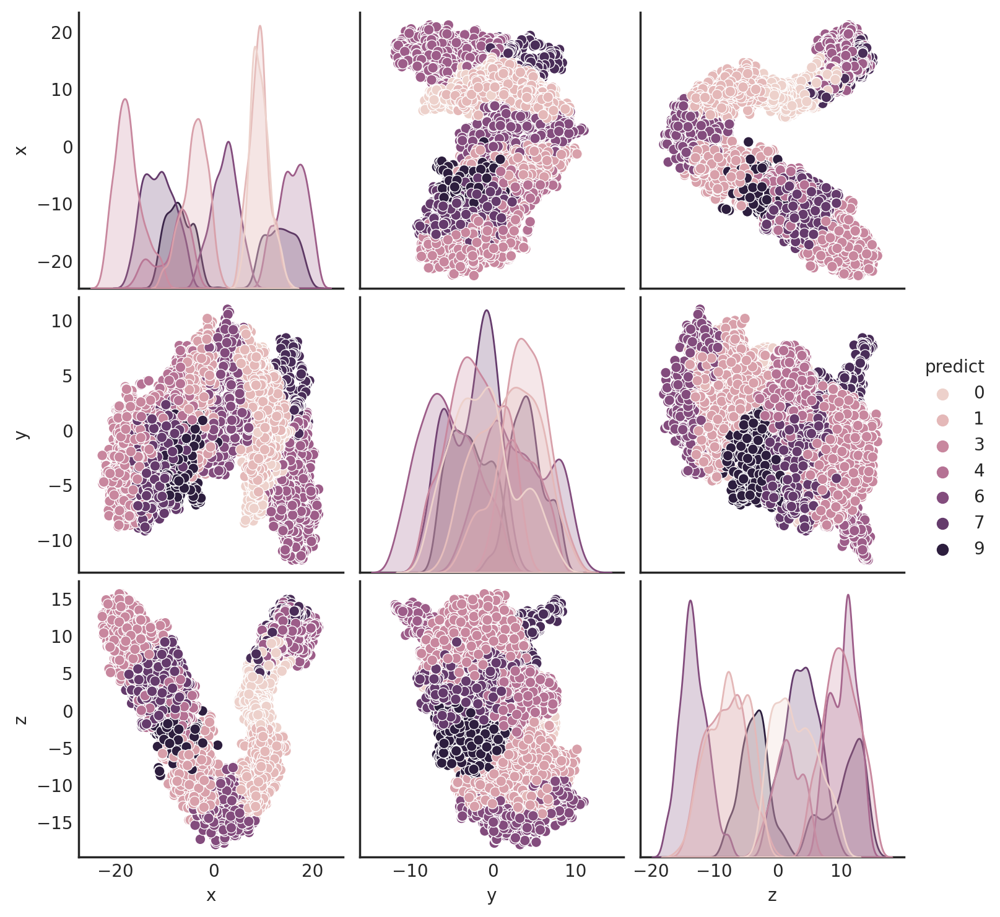

In [51]:
sns.pairplot(df, hue='predict')

<Axes: xlabel='predict', ylabel='count'>

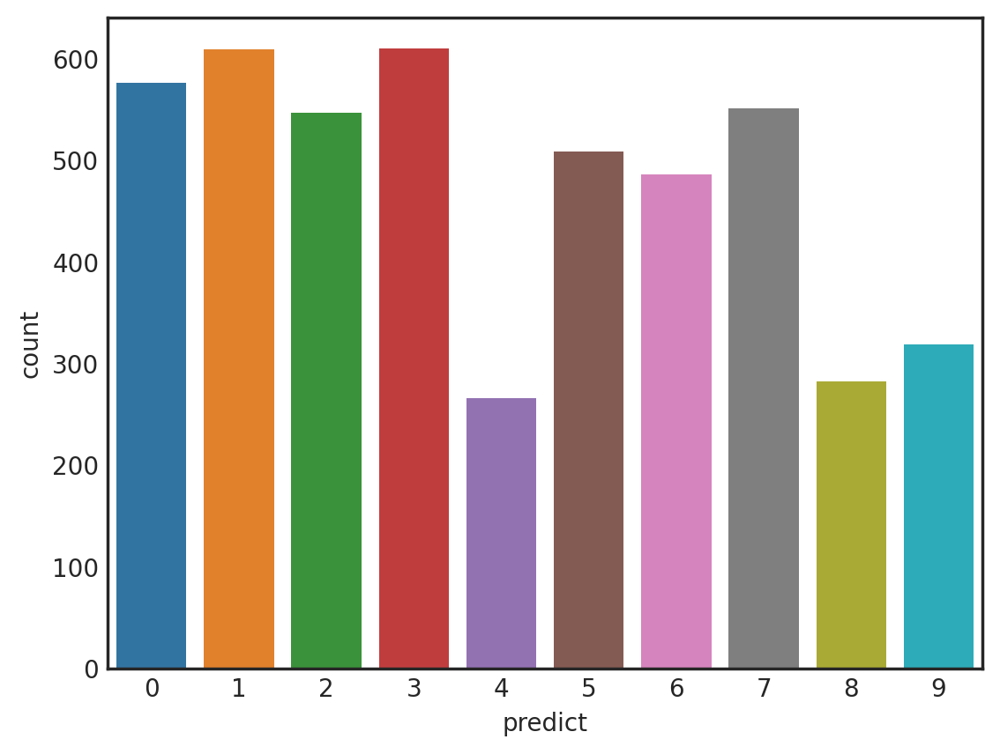

In [52]:
sns.countplot(x=df['predict'])

In [53]:
cluster0 = list(df[df['predict']==0].index)
cluster1 = list(df[df['predict']==1].index)
cluster2 = list(df[df['predict']==2].index)
cluster3 = list(df[df['predict']==3].index)
cluster4 = list(df[df['predict']==4].index)
cluster5 = list(df[df['predict']==5].index)
cluster6 = list(df[df['predict']==6].index)
cluster7 = list(df[df['predict']==7].index)
cluster8 = list(df[df['predict']==8].index)
cluster9 = list(df[df['predict']==9].index)

In [54]:
print(f'cluster0: {cluster0[:10]}')
print(f'cluster1: {cluster1[:10]}')
print(f'cluster2: {cluster2[:10]}')
print(f'cluster3: {cluster3[:10]}')
print(f'cluster4: {cluster4[:10]}')
print(f'cluster5: {cluster5[:10]}')
print(f'cluster6: {cluster6[:10]}')
print(f'cluster7: {cluster7[:10]}')
print(f'cluster8: {cluster8[:10]}')
print(f'cluster9: {cluster9[:10]}')

cluster0: ['땐', '가요', '완벽', '짐', '힘', '경험', '추억', '듬', '흠', '꺼']
cluster1: ['소소', '간짜장', '돌판', '초심', '시금치', '우수', '세팅', '옆집', '소면', '니다']
cluster2: ['적당', '분위', '수다', '구요', '잇', '체인', '소요', '울산역', '초창기', '쯤']
cluster3: ['마시', '바램', '난무', '구지', '군대', '웰빙', '픽', '식성', '텀블러', '럼']
cluster4: ['장난아', '진하', '한가위', '대왕', '농협', '숩니다', '모기', '더러움', '세', '미팅']
cluster5: ['맛', '친절', '음식', '가격', '고기', '집', '맛집', '직원', '울산', '듯']
cluster6: ['뼈다귀', '장어구이', '미니', '연', '옴', '개맛', '요인', '서생', '산채', '넹']
cluster7: ['가자미회', '환장', '치곤', '다림', '효', '용서', '호기심', '참조', '옻닭', '북적']
cluster8: ['곳', '수', '커피', '분위기', '사람', '주차', '뷰', '주차장', '방문', '번']
cluster9: ['디쉬', '로컬', '회정', '혜자', '의견', '개인차', '뚜껑', '주먹밥', '싱거', '호주']


### 비계층적 군집화

#### K-Means

/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


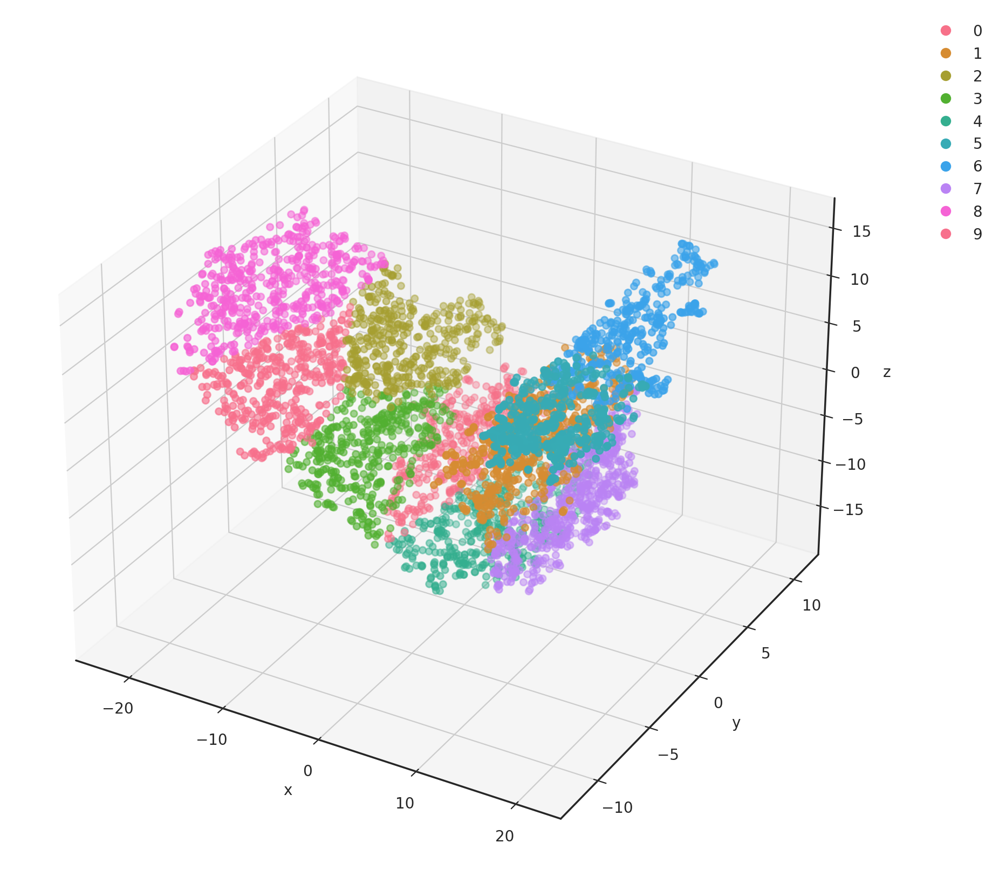

In [57]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=10)
predict = kmeans.fit_predict(df)
results = df
results['predict'] = predict

fig = plt.figure(figsize=(12, 8))
ax = Axes3D(fig)
fig.add_axes(ax)
# ax = fig.add_subplot(111, projection = '3d')
cmap = ListedColormap(sns.color_palette("husl", 256).as_hex())
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")

sc = ax.scatter(df['x'], df['y'], df['z'], c=df['predict'], cmap=cmap)
plt.legend(*sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

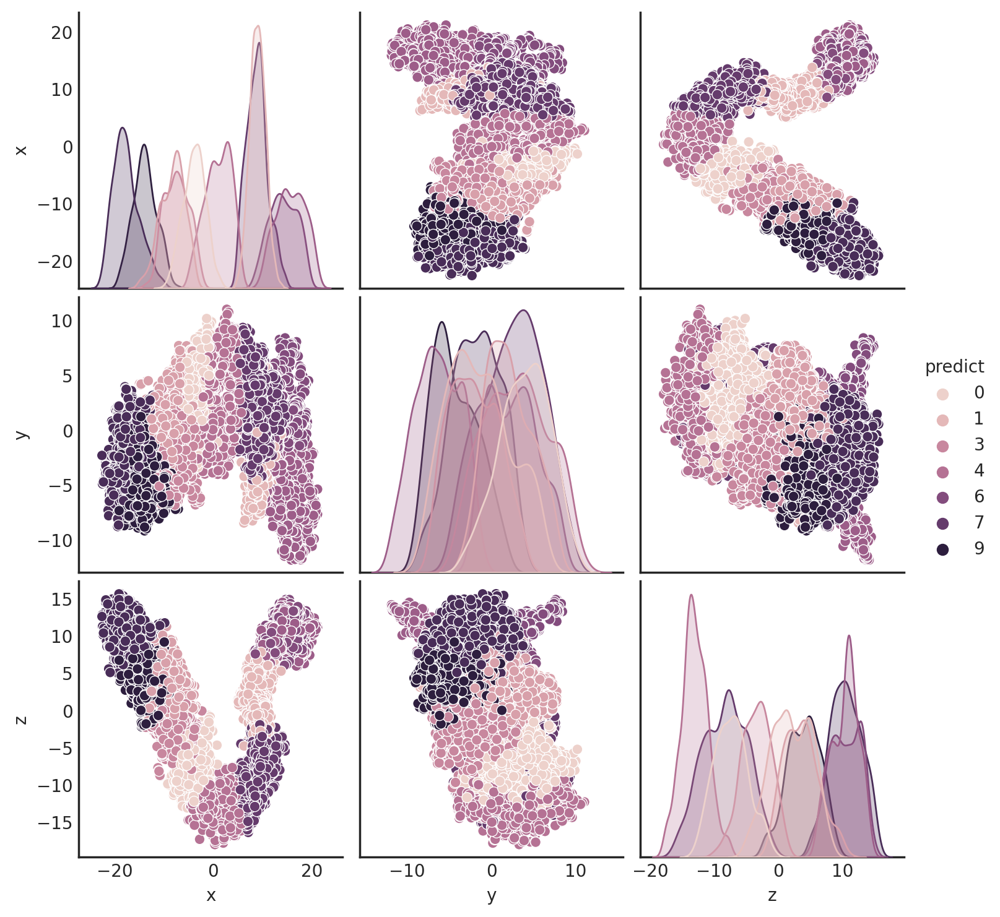

In [58]:
sns.pairplot(df, hue='predict')

<Axes: xlabel='predict', ylabel='count'>

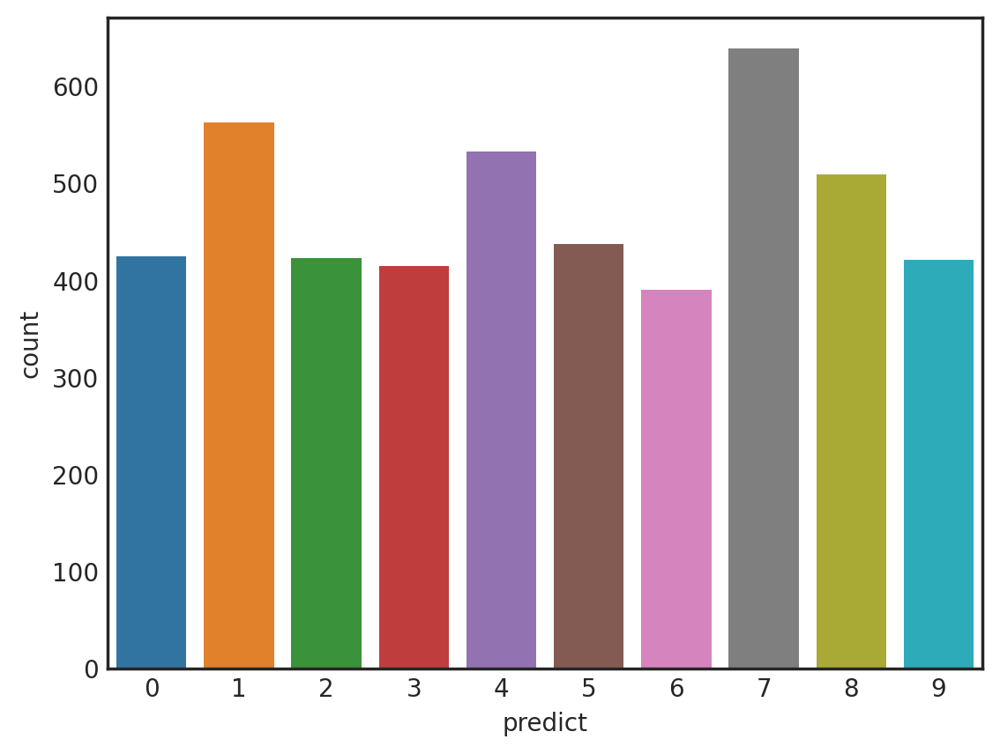

In [59]:
sns.countplot(x=df['predict'])

In [60]:
cluster0 = list(df[df['predict']==0].index)
cluster1 = list(df[df['predict']==1].index)
cluster2 = list(df[df['predict']==2].index)
cluster3 = list(df[df['predict']==3].index)
cluster4 = list(df[df['predict']==4].index)
cluster5 = list(df[df['predict']==5].index)
cluster6 = list(df[df['predict']==6].index)
cluster7 = list(df[df['predict']==7].index)
cluster8 = list(df[df['predict']==8].index)
cluster9 = list(df[df['predict']==9].index)

In [61]:
print(f'cluster0: {cluster0[:10]}')
print(f'cluster1: {cluster1[:10]}')
print(f'cluster2: {cluster2[:10]}')
print(f'cluster3: {cluster3[:10]}')
print(f'cluster4: {cluster4[:10]}')
print(f'cluster5: {cluster5[:10]}')
print(f'cluster6: {cluster6[:10]}')
print(f'cluster7: {cluster7[:10]}')
print(f'cluster8: {cluster8[:10]}')
print(f'cluster9: {cluster9[:10]}')

cluster0: ['적당', '분위', '수다', '칸막이', '잇', '체인', '울산역', '쯤', '돈값', '쾌']
cluster1: ['흠', '공짜', '닥', '별개', '감', '번창', '특색', '햄버거', '겁니다', '이하']
cluster2: ['장난아', '진하', '한가위', '대왕', '농협', '숩니다', '모기', '더러움', '다림', '미팅']
cluster3: ['디쉬', '로컬', '회정', '혜자', '개인차', '뚜껑', '삽', '주먹밥', '싱거', '호주']
cluster4: ['옴', '요인', '산채', '넹', '금', '무거동', '지난번', '적정', '성의', '우린']
cluster5: ['맛', '음식', '가격', '고기', '집', '맛집', '울산', '듯', '최고', '거']
cluster6: ['곳', '친절', '수', '커피', '분위기', '직원', '사람', '주차', '뷰', '주차장']
cluster7: ['소소', '보장', '초심', '우수', '세팅', '베리', '니다', '밥맛', '의외', '갈일']
cluster8: ['마시', '바램', '난무', '군대', '웰빙', '픽', '럼', '상관', '어버이날', '타워']
cluster9: ['가자미회', '환장', '치곤', '효', '용서', '주고', '신', '렴', '가심', '춘']


#### DBSCAN

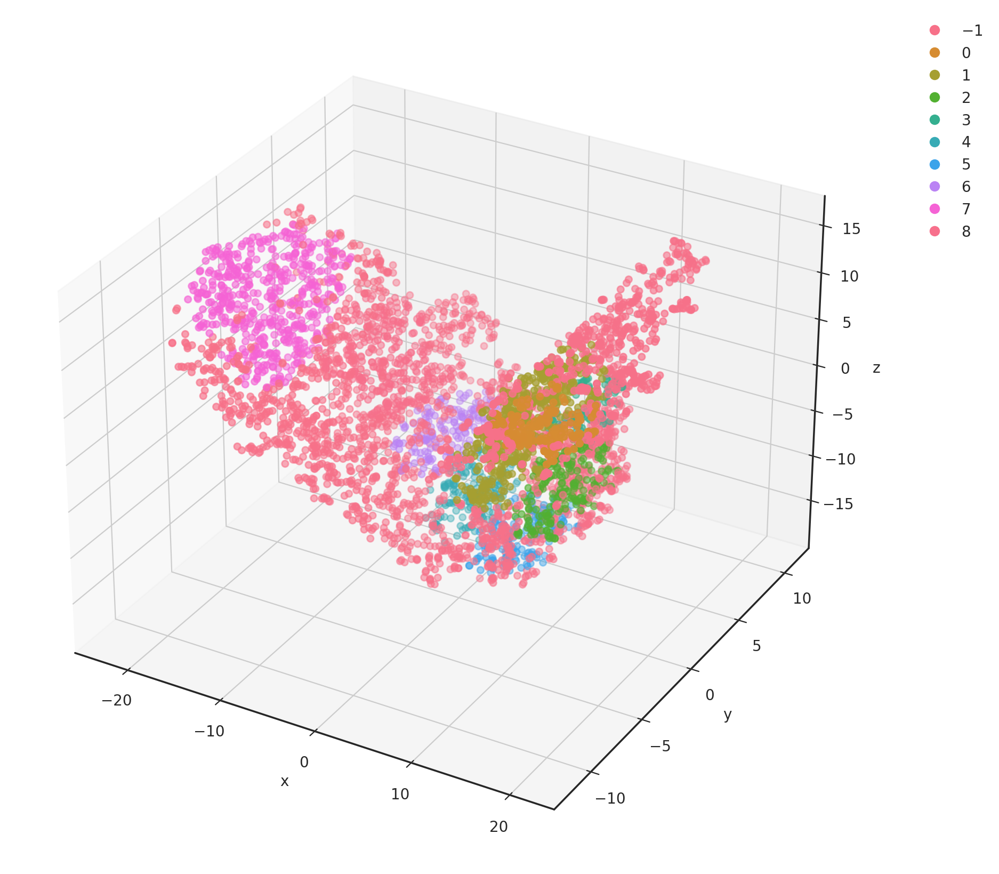

In [81]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(min_samples=100, eps=3)
predict = dbscan.fit_predict(df)
results = df
results['predict'] = predict

fig = plt.figure(figsize=(12, 8))
ax = Axes3D(fig)
fig.add_axes(ax)
# ax = fig.add_subplot(111, projection = '3d')
cmap = ListedColormap(sns.color_palette("husl", 256).as_hex())
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")

sc = ax.scatter(df['x'], df['y'], df['z'], c=df['predict'], cmap=cmap)
plt.legend(*sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)
plt.show()